In [7]:
## Compare BETHY 10-day GPP with LPJ-GUESS hourly GPP in Europe from 2017 to 2021
## Plot LPJ time series
#Import all the required packages

%matplotlib inline
import os
import re
import glob
import pandas as pd
import geopandas as gpd
import fiona
fiona.drvsupport.supported_drivers['LIBKML'] = 'rw'
import numpy as np
import xarray as xr
import rioxarray
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from scipy import stats
import cftime
import math
import pickle

def read_kml(fname, field=None):
    coords = []
    
    gdf = gpd.read_file(fname, driver='LIBKML')
    if field != None:
        coords = [[row.geometry.x, row.geometry.y, getattr(row, field)] for row in gdf.itertuples(index=True)]
    else:
        coords = [[row.geometry.x, row.geometry.y, idx+1] for idx, row in enumerate(gdf.itertuples(index=True))]
        
    return coords

In [2]:
##Set the path or file directory
chkdim = 1024
indir = 'E:\Saiful' #Parent directory
indir1 = 'E:\Saiful\LPJ_GPP\LPJ_hourly_GPP_EU' #Directory of LPJ data
#create a pattern for LPJ
fn_lpj_guess_patt = os.path.join(indir1, 'conv_lpj_hgpp_eu_0.5deg_*.nc')

In [3]:
##Set the path or file directory for BETHY 10-day data
bethy_patt = os.path.join(indir, 'BETHY_data', 'bt_europe_gpp_decade', '*D*.tif')
lst_bethy = glob.glob(bethy_patt)
# Filter the list to keep from 2017 to 2021 to match the data period of LPJ
lst_bethy_2 = [file for file in lst_bethy if re.search(r'Y(2017|2018|2019|2020|2021)', file)]
#Open the first data layer
bethy_first = xr.open_dataset(lst_bethy_2[0], engine='rasterio')
print(bethy_first)

<xarray.Dataset>
Dimensions:      (band: 1, x: 8739, y: 6274)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -32.0 -32.0 -31.99 -31.98 ... 45.99 46.0 46.0 46.01
  * y            (y) float64 82.0 82.0 81.99 81.98 ... 26.02 26.01 26.0 26.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) float32 ...


In [4]:
##Open LPJ dataset using xarray

lst_lpj = glob.glob(fn_lpj_guess_patt) #list of files from fn_lpj_guess_pattern
xlpj = xr.open_mfdataset(lst_lpj, combine='nested', concat_dim=['time'])
xlpj = xlpj.sortby('time')
#print(xlpj)


#Accumulated GPP in one hour
#the original LPJ data are in second timestep (µmol m-2 s-1 unit), so multiply with 3600
#Then, to convert from µmol to g unit by multiplying with 0.00001201
xlpj_2 = xlpj * 0.00001201 * 3600 

#Convert hourly GPP to daily sum GPP
xlpj_2_daily_sum = xlpj_2.resample(time="1d").sum(dim="time") 

#Calculate decadal summation GPP
xlpj_2_10d_sum = xlpj_2.resample(time="10D").sum(dim="time")

print(xlpj_2_10d_sum)

<xarray.Dataset>
Dimensions:    (longitude: 90, latitude: 72, time: 183)
Coordinates:
  * longitude  (longitude) float64 -9.75 -9.25 -8.75 -8.25 ... 33.75 34.25 34.75
  * latitude   (latitude) float64 35.25 35.75 36.25 36.75 ... 69.75 70.25 70.75
  * time       (time) datetime64[ns] 2017-01-01 2017-01-11 ... 2021-12-26
Data variables:
    gpp        (time, latitude, longitude) float32 dask.array<chunksize=(1, 72, 90), meta=np.ndarray>
Attributes: (12/17)
    CDI:                        Climate Data Interface version 1.9.9rc1 (http...
    Conventions:                CF-1.6
    NCO:                        netCDF Operators version 4.9.1 (Homepage = ht...
    cdo_openmp_thread_number:   4
    CDO:                        Climate Data Operators version 1.9.9rc1 (http...
    contact:                    Zhendong Wu, ICOS CP, Lund University, Zhendo...
    ...                         ...
    geospatial_lon_resolution:  0.5 degree
    institution:                ICOS ERIC Carbon Portal at Lund U

In [5]:
##Open BETHY dataset using xarray and combine the datasets
bethy_full = xr.open_mfdataset(lst_bethy_2, combine='nested', concat_dim=['band'])
print(bethy_full)

##Check spatial reference of BETHY
bethy_full.spatial_ref.attrs

<xarray.Dataset>
Dimensions:      (band: 180, x: 8739, y: 6274)
Coordinates:
  * band         (band) int32 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1
  * x            (x) float64 -32.0 -32.0 -31.99 -31.98 ... 45.99 46.0 46.0 46.01
  * y            (y) float64 82.0 82.0 81.99 81.98 ... 26.02 26.01 26.0 26.0
    spatial_ref  int32 0
Data variables:
    band_data    (band, y, x) float32 dask.array<chunksize=(1, 6274, 8739), meta=np.ndarray>


{'GeoTransform': '-32.00892748090956 0.008928572791499726 0.0 82.008927476671 0.0 -0.008928562055103818'}

In [6]:
##Open the KML file containing the sample points

pts = read_kml(os.path.join(indir, 'BETHY_data', 'bt_europe', 'europeLPJ_sample_4.kml')) #, 'click'
print(pts)

[[-5.75575452086703, 40.0080542529708, 1], [23.0736672527159, 52.4380396101478, 2], [5.33836956080819, 44.2870217296024, 3], [9.07495412722206, 50.6154094941613, 4], [7.83269818253244, 46.7281946887473, 5], [-4.97496947775681, 40.9596352322487, 6], [16.0824156190516, 53.1845674676702, 7], [22.1295333040348, 52.7160212534025, 8], [24.397939799647, 50.5051866827051, 9], [19.3433119990728, 49.0261763930267, 10], [30.4766429476738, 47.422969273992, 11], [17.1367090181793, 47.9896405710419, 12], [20.8123339577545, 49.4805377877087, 13], [3.39606317082162, 49.3321378562387, 14], [-0.167748595939941, 52.2797426890301, 15], [25.8081700035765, 47.6766160656794, 16], [-3.06005616404389, 42.6399522976834, 17], [14.9343141338962, 51.8953990318221, 18], [1.35931930878426, 47.8654403209983, 19], [1.5875203192093, 44.5245072398962, 20], [-3.22102691973168, 41.549969754164, 21], [9.92328200605477, 48.9559424247788, 22], [20.9823442174107, 48.018469830189, 23], [9.77329719848922, 45.8287724570193, 24],

In [12]:
##Create a tuple containing daily sum and 10-days sum GPP from LPJ

tpierce2 = []
for p in pts:
    gpp_1d_sum = xlpj_2_daily_sum.gpp.sel(longitude=p[0], latitude=p[1], method='nearest').values #daily sum
    gpp_10d_sum = xlpj_2_10d_sum.gpp.sel(longitude=p[0], latitude=p[1], method='nearest').values #10-days sum
    
    t_daily = xlpj_2_daily_sum.coords['time'].values #daily dates
    t_10d = pd.date_range(start=t_daily[0], end=t_daily[-1], freq='10D') #10-days date
    
    tpierce2.append([p, t_daily, t_10d, gpp_1d_sum, gpp_10d_sum])

# Specify the file path and save the tuple
tuple_file = os.path.join(os.getcwd(), 'tpierce2.pkl')

# Save
with open(tuple_file, 'wb') as f:
    pickle.dump(tpierce2, f)

In [13]:
#Load tuple

tuple_file = 'tpierce2.pkl'

if os.path.exists(tuple_file):
    with open(tuple_file, 'rb') as f:
        tpierce2 = pickle.load(f)
       
else:
    print(f"File '{tuple_file}' does not exist.")


In [9]:
len(t_10d) #check the length of 10-days date

183

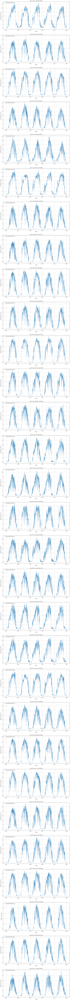

In [10]:
##Plot daily sum LPJ GPP

fig, axs = plt.subplots(ncols=1, nrows=len(pts), figsize=(16, len(pts)*8))

for idx, ax in enumerate(axs):

    ax.plot_date(tpierce2[idx][1], tpierce2[idx][3], '-', linewidth=0.7, label='Daily total GPP from LPJ')

    ax.set_title('pt={}: lon={}, lat={}'.format(tpierce2[idx][0][2], np.round(tpierce2[idx][0][0],2), np.round(tpierce2[idx][0][1],2)))
    ax.legend(loc='upper left')
    ax.grid()
    ax.set_xlabel('Dates')
    ax.set_ylabel('GPP (g C\m^2\d^2)')
plt.show()

C:\Users\isla_md\AppData\Local\Temp\ipykernel_10820\3898357142.py:15: UserWarning: Glyph 8 ) missing from current font.
  plt.tight_layout()
C:\Users\isla_md\AppData\Local\miniforge3\envs\dev\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8 ) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


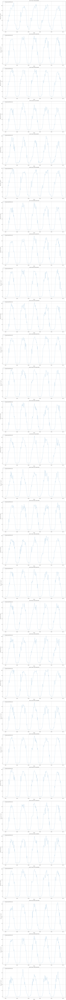

In [11]:
#Plot 10-days sum GPP of LPJ

fig, axs = plt.subplots(ncols=1, nrows=len(pts), figsize=(16, len(pts)*8))

for idx, ax in enumerate(axs):
    
    ax.plot_date(tpierce2[idx][2], tpierce2[idx][4], '-', linewidth=0.7, label='10-days total GPP from LPJ')
    

    ax.set_title('pt={}: lon={}, lat={}'.format(tpierce2[idx][0][2], np.round(tpierce2[idx][0][0],2), np.round(tpierce2[idx][0][1],2)))
    ax.legend(loc='upper left')
    ax.grid()
    ax.set_xlabel('Dates')
    ax.set_ylabel('GPP (g C\m^2\10d^2)')

plt.tight_layout()
plt.show()

In [12]:
## Create a tuple for 10-days sum GPP from BETHY
tp_bethy = []
for p in pts:
    gpp_10d_bt = bethy_full.band_data.sel(x=p[0], y=p[1], method='nearest').values
    gpp_10d_sum = xlpj_2_10d_sum.gpp.sel(longitude=p[0], latitude=p[1], method='nearest').values #10-days sum
    #Get the dates for BETHY. Three dates per mobth to match the length of the BETHY decadal data
    t = [datetime(year, month, day) for year in range(2017, 2022) for month in range(1, 13) for day in range(1, 4)]
    tp_bethy.append([p, t, gpp_10d_bt, gpp_10d_sum])
    
# Specify the file path and save the tuple
tuple_file = os.path.join(os.getcwd(), 'tp_bethy.pkl')

# Save
with open(tuple_file, 'wb') as f:
    pickle.dump(tp_bethy, f)

In [ ]:
#Load tuple

tuple_file = 'tp_bethy.pkl'

if os.path.exists(tuple_file):
    with open(tuple_file, 'rb') as f:
        tp_bethy = pickle.load(f)
        
else:
    print(f"File '{tuple_file}' does not exist.")

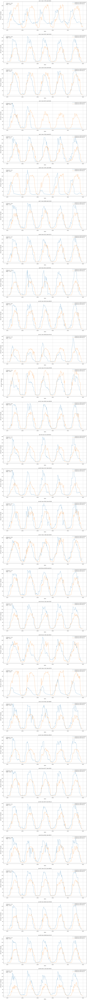

In [23]:
#Plot the BETHY time series

#dates
t_10d = pd.date_range(start=t_daily[0], end=t_daily[-1], freq='10D')
fig, axs = plt.subplots(ncols=1, nrows=len(pts), figsize=(20, len(pts)*8))

for idx, ax in enumerate(axs):
    #dates = [datetime.strptime(date_str, "%Y-%m-%d") for date_str in tp_bethy[idx][1]]
    ax.plot_date(tp_bethy[idx][1], tp_bethy[idx][2], '-', linewidth=1.0, label='Decadal sum GPP from BETHY')
    ax.plot_date(tpierce2[idx][2], tp_bethy[idx][3], '-', linewidth=1.0, label='Decadal sum GPP from LPJ')

    ax.set_title('pt={}: lon={}, lat={}'.format(tp_bethy[idx][0][2], np.round(tp_bethy[idx][0][0],2), np.round(tp_bethy[idx][0][1],2)))
    ax.legend(loc='upper right')
    ax.grid()
    
    # Calculate Pearson correlation and R-squared
    gpp_10d_bethy = np.array(tp_bethy[idx][2])
    gpp_10d_lpj = np.array(tp_bethy[idx][3])
    gpp_10d_lpj = gpp_10d_lpj[:180]
    correlation = stats.pearsonr(gpp_10d_lpj, gpp_10d_bethy)[0]
    r_squared = correlation ** 2
    # Add R-squared value to the plot
    ax.text(0.03, 0.93, f'R-squared = {r_squared:.2f}', transform=ax.transAxes)
    
    #Estimate RMSE
    MSE = np.square(np.subtract(gpp_10d_lpj,gpp_10d_bethy)).mean()
    RMSE = math.sqrt(MSE)
    #Add RMSE on the plot
    ax.text(0.03, 0.89, f'RMSE = {RMSE:.2f}', transform=ax.transAxes)

    #years = YearLocator()
    ax.xaxis.set_major_locator(mdates.YearLocator(1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.set_xlabel('Dates')
    ax.set_ylabel('GPP (gC/m^2/decade)')

fig.tight_layout() #Adjust the spacing  
plt.show()